# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import shap

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [3]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek

In [4]:
# librairies pour ne pas afficher les warning
import warnings
warnings.filterwarnings('ignore')

In [5]:
np.random.seed(0)

In [6]:
pd.options.display.max_columns = 200

In [7]:
import mlflow
from mlflow.tracking import MlflowClient

In [8]:
mlflow.set_tracking_uri('http://127.0.0.1:5000/')

In [9]:
train_df = pd.read_csv('models/train_df_cleaned.csv')
test_df = pd.read_csv('models/test_df_cleaned.csv')

In [10]:
# Nous devons retirer les caractères spéciaux des noms des features pour l'utilisation de certains modèles (LightGBM)
import re
train_df = train_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_df = test_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [11]:
X_train, X_val, y_train, y_val = train_test_split(train_df.drop(['TARGET','SK_ID_CURR'], axis = 1),
                                                    train_df['TARGET'],
                                                    test_size=0.2, random_state=42)


print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(246005, 559) (246005,)
(61502, 559) (61502,)


## Load Pickles

In [12]:
X_train_scaled = pd.read_pickle('models/X_train_scaled.pkl')
y_train = pd.read_pickle('models/y_train.pkl')
X_val = pd.read_pickle('models/X_val.pkl')
X_val_scaled = pd.read_pickle('models/X_val_scaled.pkl')
y_val = pd.read_pickle('models/y_val.pkl')
X_val_test = pd.read_pickle('models/X_val_test.pkl')
X_val_test_scaled = pd.read_pickle('models/X_val_test_scaled.pkl')
y_val_test = pd.read_pickle('models/y_val_test.pkl')

In [13]:
cols = X_train.select_dtypes(['float64']).columns

X_train_scaled = X_train.copy()
X_val_scaled = X_val.copy()
X_val_test_scaled = X_val_test.copy()
X_test_scaled = test_df.copy()

std_scale = StandardScaler()
std_scale.fit(X_train[cols])

X_train_scaled[cols] = std_scale.transform(X_train[cols])
X_val_scaled[cols] = std_scale.transform(X_val[cols])
X_val_test_scaled[cols] = std_scale.transform(X_val_test[cols])
X_test_scaled[cols] = std_scale.transform(test_df[cols])

## Fonction Métier

Nous créons les fonctions que nous utiliserons dans la suite de la modélisation. Ces fonctions permettent notamment de calculer certaines métriques et graphes à des fins de comparaison des performances de nos modèles.

Nous crééons une métrique personnalisée ayant une approche métier. Le but ici est de pénaliser plus fortement les faux négatifs (mauvais client prédit bon client) qui engendrent une grande perte de capital. On suppose ici que le coût d’un FN (Faux Négatif) est dix fois supérieur au coût d’un FP (Faux Positif).

Nous calculerons également d'autres métriques telles que :

- Accuracy : somme de tous les vrais positifs et vrais négatifs qu'il divise par le nombre total d'instances. Il permet d'apporter une réponse à la question suivante : de toutes les classes positives et négatives, combien parmi elles ont été prédites correctement ? Des valeurs élevées de ce paramètre sont souvent souhaitables.

- Precision : indique le rapport entre les prévisions positives correctes et le nombre total de prévisions positives. Ce paramètre répond donc à la question suivante : sur tous les enregistrements positifs prédits, combien sont réellement positifs ?

- Recall/Rappel : paramètre qui permet de mesurer le nombre de prévisions positives correctes sur le nombre total de données positives. Il permet de répondre à la question suivante : sur tous les enregistrements positifs, combien ont été correctement prédits ? La mesure vise à minimiser les faux négatifs.

- F1 score : moyenne harmonique de la précision et du rappel. Il équivaut au double du produit de ces deux paramètres sur leur somme. Sa valeur est maximale lorsque le rappel et la précision sont équivalents. Il est particulièrement difficile de comparer deux modèles avec une faible précision et un rappel élevé. Le contraire est également vérifié. Dans ces conditions, le score F1 permet de mesurer ces deux paramètres simultanément.

- Fbeta score : généralisation de la F-measure qui ajoute un paramètre de configuration appelé beta. Une valeur bêta par défaut est 1.0, ce qui est identique à la mesure F. Une valeur bêta plus petite, telle que 0.5, donne plus de poids à la précision et moins au rappel, tandis qu'une valeur bêta plus grande, telle que 2.0, donne moins de poids à la précision et plus de poids au rappel dans le calcul du score. Ici nous donnons plus de poids au rappel qui minimise les faux négatifs.

- ROC AUC score : mesure de façon globale la performance d’un modèle de classification. Il indique à quel point le modèle est capable de faire la distinction entre les classes. Il est égal à 1 pour un modèle parfait et à 0.5 pour un modèle non-informatif.



In [14]:
def fonction_metier(y_true, y_pred):
    '''Créer un score métier à partir de la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: gain (score métier)
    '''
    TP_coeff = 0       # Vrais positifs
    FP_coeff = -1       # Faux positifs (prédit comme faisant défaut (1) mais ne fait pas défaut (0))
    FN_coeff = -10     # Faux négatifs (prédit comme ne faisant pas défaut (0) mais font défaut (1))
    TN_coeff = 0       # Vrais négatifs

    (TN, FP, FN, TP) = metrics.confusion_matrix(y_true, y_pred).ravel()

    gain = (TP*TP_coeff + TN*TN_coeff + FP*FP_coeff + FN*FN_coeff)/(TN+FP+FN+TP)

    return gain

def score_metier_max(y_pred_proba, y_true, verbose=True):
    '''Créer un graphique permettant de déterminer quel peut être le score max en fonction du threshold.
    :param: y_pred_proba (probabilités prédites par le modèle), y_true (vraies valeurs),
    verbose (affiche le graphe ou juste le score maximal)
    :return: graphique,
    '''
    scores = []
    for threshold in np.linspace(0, 1, num=101):
        y_pred = np.where(y_pred_proba > threshold, 1, 0)
        score = fonction_metier(y_true, y_pred)
        scores.append(score)

    if verbose == True:
        score_max = max(scores)
        opti_threshold = np.linspace(0, 1, num=101)[scores.index(score_max)]
        y_pred = np.where(y_pred_proba > opti_threshold, 1, 0)

        print("Score métier maximum : {:.2f}".format(score_max))
        print("Threshold optimal : {}".format(opti_threshold))

        fig, ax = plt.subplots(figsize=(6, 5))
        plt.plot(np.linspace(0, 1, num=101), scores, label="model score")
        plt.axvline(x=opti_threshold, color='k', dashes=(0.5, 1),
                    label="optimal threshold: {}".format(opti_threshold))

        plt.title("Score métier en fonction du threshold", fontsize=10)
        plt.xlabel("Thresholds", fontsize=10)
        plt.ylabel("Score métier", fontsize=10)
        plt.legend()
        plt.show()

    else:
        return max(scores)


def conf_mat_transform(y_true, y_pred):
    '''Créer et affiche la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: affiche la matrice de confusion
    '''
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    plt.figure(figsize = (6,4))
    sns.heatmap(conf_mat, annot=True, fmt='d',cmap="Blues")

    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Matrice de confusion')


def eval_score(model, X_val, y_true, seuil=0.5):
    '''Calcule, affiche et enregistre les différentes métriques.
    :param: model, X_val (dataframe de validation), y_true (vraies valeurs),
    seuil (seuil de détermination des prédictions)
    :return: affiche (et return) les métriques, la matrice de confusion et la courbe ROC.
    '''
    y_pred_proba = model.predict_proba(X_val)[:, 1]
    y_pred = np.where(y_pred_proba > seuil, 1, 0)

    metier = fonction_metier(y_true, y_pred)
    accuracy = metrics.accuracy_score(y_true, y_pred)
    precision = metrics.precision_score(y_true, y_pred)
    recall = metrics.recall_score(y_true, y_pred)
    f1_score = metrics.f1_score(y_true, y_pred)
    fbeta_score = metrics.fbeta_score(y_true, y_pred, beta=2)
    rocauc = metrics.roc_auc_score(y_true, y_pred)

    print('Score métier :{:.2f}'.format(metier))
    print('Accuracy score : {:.2f}'.format(accuracy))
    print('Precision score : {:.2f}'.format(precision))
    print('Recall score : {:.2f}'.format(recall))
    print('F1 score : {:.2f}'.format(f1_score))
    print('Fbeta score : {:.2f}'.format(fbeta_score))
    print('ROC AUC score : {:.2f}'.format(rocauc))


    conf_mat_transform(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(6, 5))

    fpr, tpr, threshold = metrics.roc_curve(y_true, y_pred_proba)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('Courbe ROC')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

    return metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba

## MLFlow

In [15]:
mlflow.autolog(log_input_examples=True, silent=True)

In [35]:
# Check if there is an active run
if mlflow.active_run():
    # If there is an active run, end it before starting a new one
    mlflow.end_run()

# Equilibrages

#### Aucun rééquilibrage

Score métier :-0.80
Accuracy score : 0.92
Precision score : 0.57
Recall score : 0.03
F1 score : 0.05
Fbeta score : 0.03
ROC AUC score : 0.51


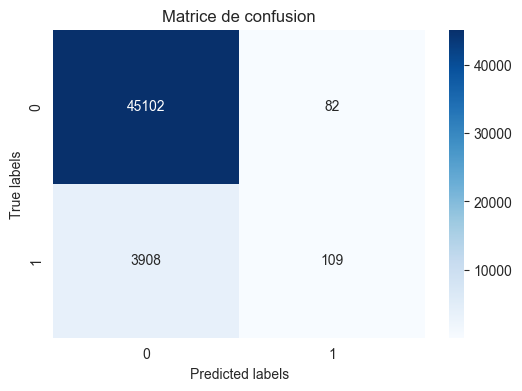

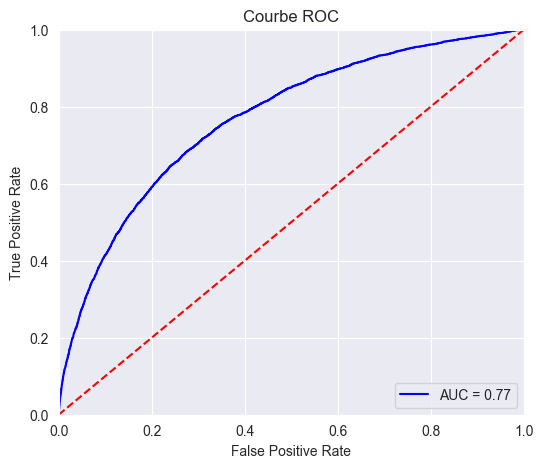

In [36]:
with mlflow.start_run(run_name='LogisticRegression sans équilibrage'):
    reg_log_inequal = LogisticRegression(max_iter=1000,random_state=0)
    reg_log_inequal.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_inequal, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

#### Rééquilibrage avec class_weight

La méthode des class weight permet de prendre en compte le caractère biaisé de la distribution du dataset et de créer un modèle pénalisé. Il s’agit ici de simplement attribuer des poids différents aux différentes classes de notre dataset, en donnant un poids plus important aux classes minoritaires, afin d’influencer le modèle lors de son entraînement. Nous pénalisons ainsi plus fortement une erreur de classification d’une classe minoritaire par rapport à une erreur de classification d’une classe majoritaire.

Score métier :-0.51
Accuracy score : 0.71
Precision score : 0.18
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.71


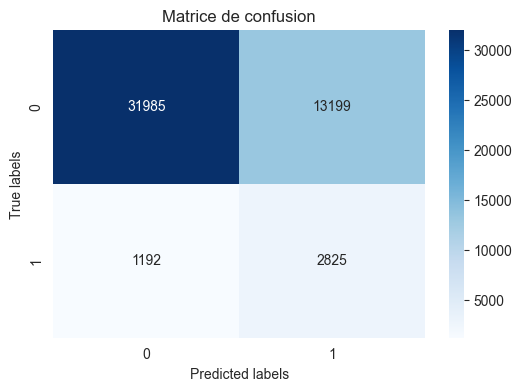

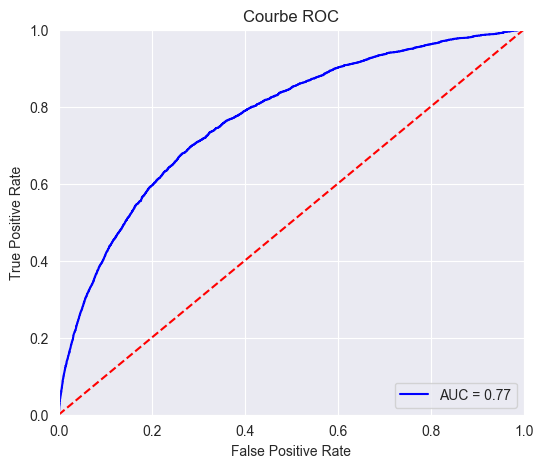

In [37]:
with mlflow.start_run(run_name='LogisticRegression class_weight'):
    reg_log_balanced = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=0)
    reg_log_balanced.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_balanced, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

####  Rééquilibrage avec Sur-échantillonnage (upsampling) de la classe minoritaire : SMOTE

L'oversampling (sur-échantillonnage) est une technique utilisée pour remédier au déséquilibre de classes dans un jeu de données, où une classe est sous-représentée par rapport à une autre classe. L'objectif de l'oversampling est de générer des échantillons synthétiques de la classe minoritaire afin d'équilibrer les classes et d'améliorer les performances du modèle.

Le SMOTE, acronyme pour Synthetic Minority Oversampling TEchnique, est une méthode de suréchantillonnage des observations minoritaires. Pour éviter de réaliser un simple clonage des individus minoritaires, le SMOTE se base sur un principe simple : générer de nouveaux individus minoritaires qui ressemblent aux autres, sans être strictement identiques. Cela permet de densifier de façon plus homogène la population d’individus minoritaires.

Equilibre des classes : Counter({0: 226201, 1: 19804})


  File "C:\Users\Shadow\Documents\Scoring\Scoring\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


Equilibre des classes : Counter({1: 226201, 0: 226201})
Score métier :-0.79
Accuracy score : 0.92
Precision score : 0.52
Recall score : 0.03
F1 score : 0.06
Fbeta score : 0.04
ROC AUC score : 0.51


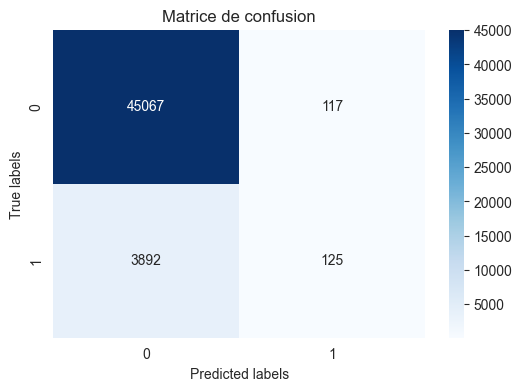

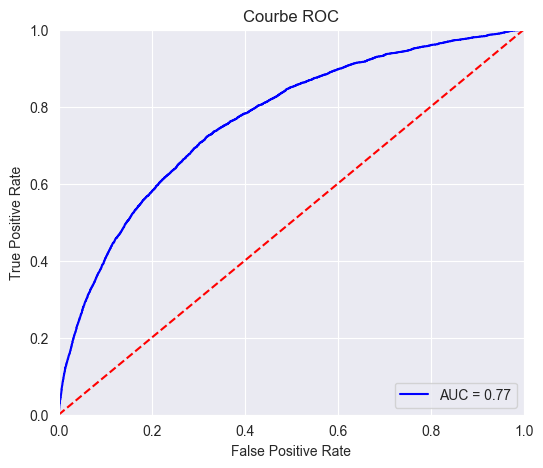

In [38]:
print('Equilibre des classes : {}'.format(Counter(y_train)))

# Définition de l'instance SMOTE
sm = SMOTE(random_state=0)

# Application du SMOTE aux données
X_train_sm, y_train_sm = sm.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_sm)))

with mlflow.start_run(run_name='LogisticRegression upsampling'):
    reg_log_up = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_up.fit(X_train_sm, y_train_sm)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_up, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

#### Rééquilibrage avec Sous-échantillonnage (undersampling) de la classe majoritaire : Tomek Links


Equilibre des classes : Counter({0: 226201, 1: 19804})
Equilibre des classes : Counter({0: 222816, 1: 19804})
Score métier :-0.79
Accuracy score : 0.92
Precision score : 0.57
Recall score : 0.03
F1 score : 0.06
Fbeta score : 0.04
ROC AUC score : 0.51


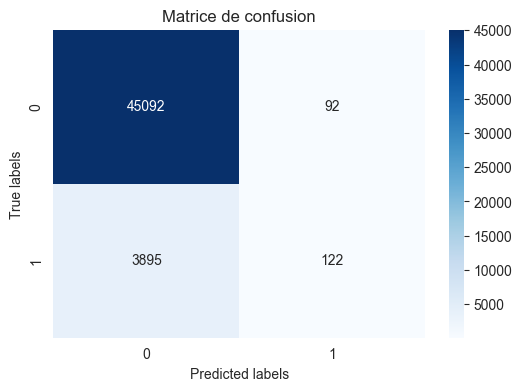

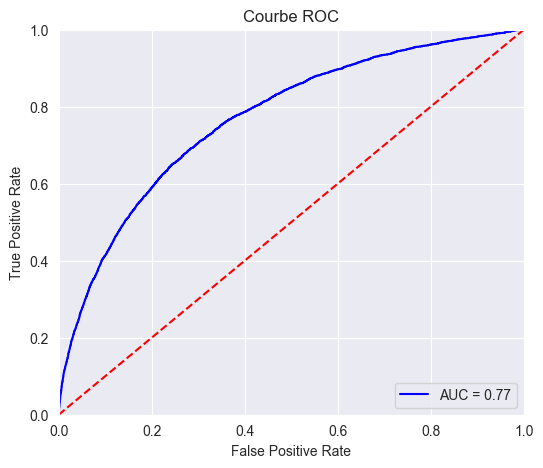

In [39]:
print('Equilibre des classes : {}'.format(Counter(y_train)))

# Création de l'objet TomekLinks
tomek_links = TomekLinks()

# Sous-échantillonnage en utilisant Tomek Links
X_train_tl, y_train_tl = tomek_links.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_tl)))


with mlflow.start_run(run_name='LogisticRegression undersampling'):
    reg_log_under = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under.fit(X_train_tl, y_train_tl)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_under, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

#### Rééquilibrage avec Sous-échantillonnage (undersampling) de la classe majoritaire : RandomUnderSampler


Equilibre des classes : Counter({0: 226201, 1: 19804})
Equilibre des classes : Counter({0: 19804, 1: 19804})
Score métier :-0.52
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


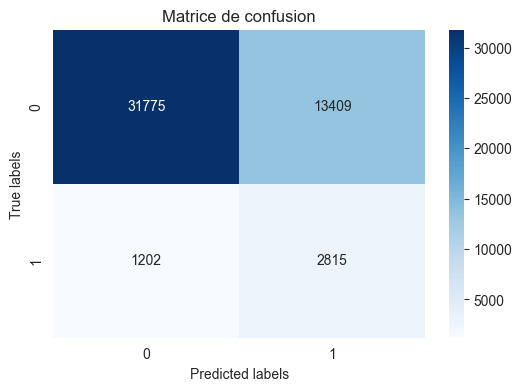

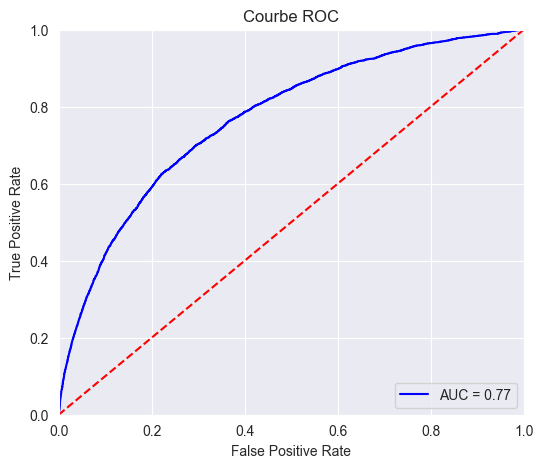

In [40]:
print('Equilibre des classes : {}'.format(Counter(y_train)))

# Création de l'objet TomekLinks
under = RandomUnderSampler()

# Sous-échantillonnage en utilisant RandomUnderSampler
X_train_under, y_train_under = under.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_under)))


with mlflow.start_run(run_name='LogisticRegression undersampling Random'):
    reg_log_under_r = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under_r.fit(X_train_under, y_train_under)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_under_r, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

#### Combinaison d'oversampling et d'undersampling : SMOTE (oversampling) et Tomek Links (undersampling)


In [41]:

print('Equilibre des classes : {}'.format(Counter(y_train)))

# Création de l'objet SMOTETomek
smote_tomek = SMOTETomek(random_state=0)

# Sous-échantillonnage en utilisant SMOTETomek
X_train_st, y_train_st = smote_tomek.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_st)))

Equilibre des classes : Counter({0: 226201, 1: 19804})
Equilibre des classes : Counter({1: 226193, 0: 226193})


Score métier :-0.79
Accuracy score : 0.92
Precision score : 0.52
Recall score : 0.03
F1 score : 0.06
Fbeta score : 0.04
ROC AUC score : 0.51


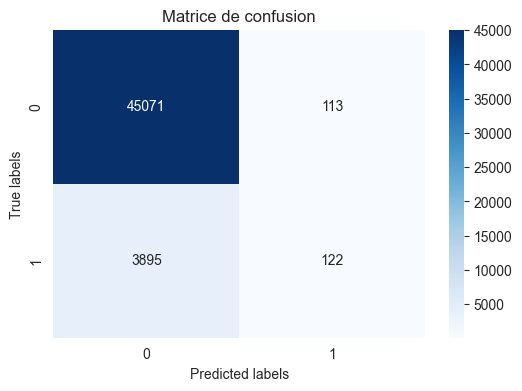

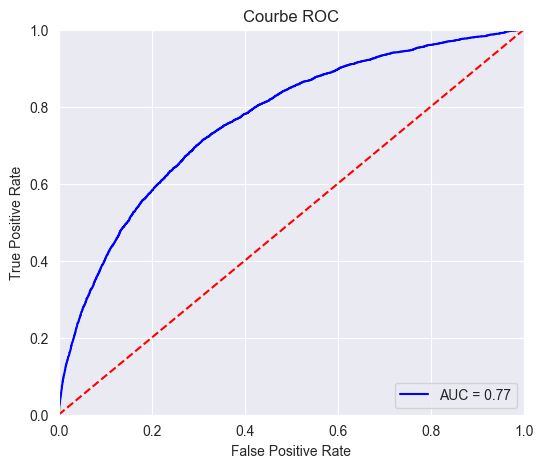

In [42]:
with mlflow.start_run(run_name='LogisticRegression combinaison'):
    reg_log_combi = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_combi.fit(X_train_st, y_train_st)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_combi, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

On choisit la méthode d'undersampling avec RandomUnderSampler pour le rééquilibrage de nos données.
La décision est motivée par le bon score métier, le faible nombre de faux négatifs et la rapidité d'exécution.

In [43]:
#enregistrer le df train rééquilibré
pickle.dump(X_train_under, open("models/X_train_under.pkl", 'wb'))
pickle.dump(y_train_under, open("models/y_train_under.pkl", 'wb'))

# Modèles

Nous allons tester différents algorithmes sans optimisation des hyperparamètres :

- Dummy Classifier (baseline) : ne prend pas en compte les caractéristiques du jeu de données et se contente de faire des prédictions en utilisant des règles simples. Ici, on renvoie l'étiquette de classe la plus fréquente dans l'argument y observé.

- Logistic Regression : le but est de trouver une relation mathématique entre les variables d'entrée (features) et la variable de sortie (classe prédite). Cette relation est généralement exprimée sous la forme d'une fonction logistique qui transforme la sortie en une probabilité.

- SVC: L'algorithme fonctionne en trouvant un hyperplan optimal qui sépare les données d'entraînement en différentes classes. L'hyperplan est déterminé de manière à maximiser la marge entre les points de données de chaque classe. Les points de données les plus proches de l'hyperplan sont appelés vecteurs de support.

- Decision Tree: algorithme d'apprentissage automatique qui prend un ensemble de données en entrée et construit un modèle prédictif sous forme d'arbre hiérarchique. Chaque nœud de l'arbre représente une caractéristique de l'ensemble de données, chaque branche représente une règle de décision basée sur cette caractéristique, et chaque feuille représente une classe ou une valeur prédite.

- Random Forest : algorithme d'apprentissage automatique qui combine plusieurs arbres de décision pour effectuer des prédictions. Chaque arbre de la forêt donne une prédiction et la classe prédite est déterminée par un vote majoritaire.

- XG Boost : utilise un ensemble de modèles d'arbres de décision pour effectuer des prédictions. L'algorithme fonctionne en itérations successives pour minimiser une fonction de perte spécifiée et ajouter des arbres qui réduisent cette perte.

- Light GBM : algorithme d'apprentissage automatique basé sur le gradient boosting qui est conçu pour offrir une exécution rapide et des performances élevées. Il utilise une technique d'échantillonnage basée sur le gradient pour sélectionner les échantillons les plus informatifs pendant le processus d'apprentissage.


In [44]:
X_train_scaled = pd.read_pickle('models/X_train_under.pkl')
y_train = pd.read_pickle('models/y_train_under.pkl')

#### Dummy Classifier

Score métier :-0.82
Accuracy score : 0.92
Precision score : 0.00
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


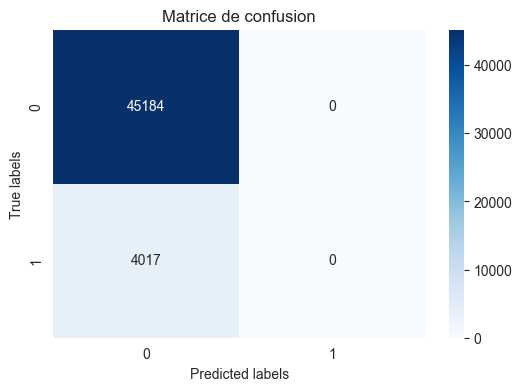

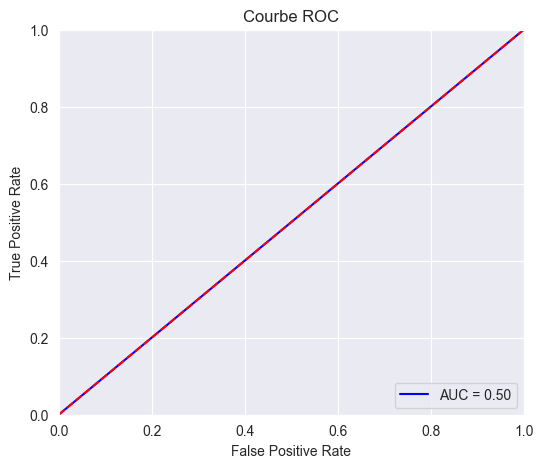

In [45]:
with mlflow.start_run(run_name='Dummy Classifier'):
    dummy = DummyClassifier(random_state=0)
    dummy.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(dummy, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.82
Threshold optimal : 0.5


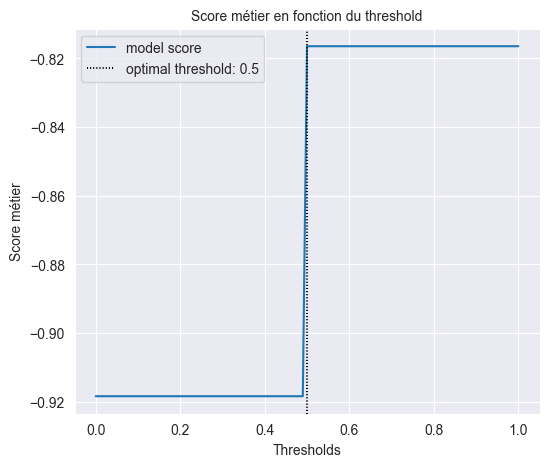

In [46]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Dummy Classifier prédit bien seulement la classe 0 (client ne faisant pas défaut) et contient donc beaucoup de faux négatifs (mauvais client prédit bon client). C'est la raison pour laquelle il possède un score métier relativement faible (car ce dernier pénalise plus fortement les faux négatifs).

La plupart de nos scores sont à 0 puisque le modèle ne prédit aucune valeur positive. Les scores sont donc estimés à 0 puisque cela engendre une division par 0.

On constate que l'AUC est de 0.5 comme c'est le cas pour les modèles baseline.

#### Logistic Regression

Score métier :-0.52
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


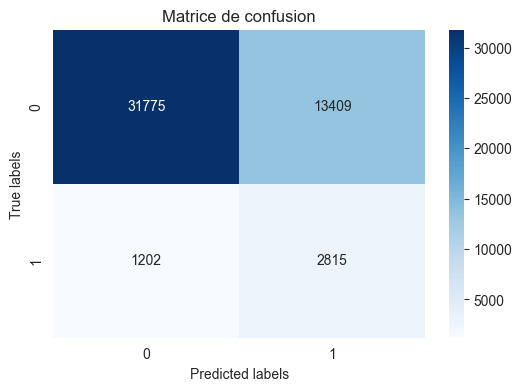

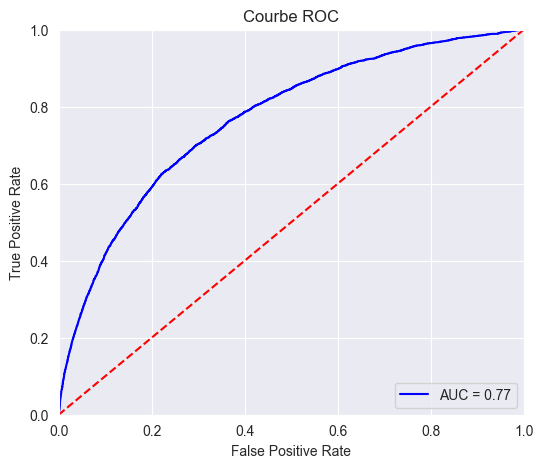

In [47]:
with mlflow.start_run(run_name='Logistic Regression'):
    reg_log = LogisticRegression(max_iter=1000, random_state=0)
    reg_log.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.51
Threshold optimal : 0.56


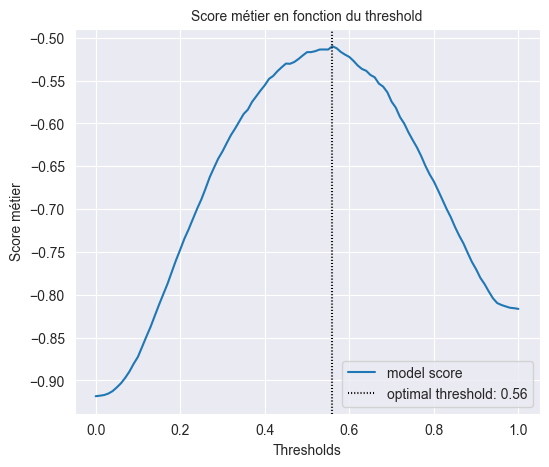

In [48]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Le score métier est nettement meilleur.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.77.


#### Decision Tree

Score métier :-0.71
Accuracy score : 0.59
Precision score : 0.11
Recall score : 0.60
F1 score : 0.19
Fbeta score : 0.32
ROC AUC score : 0.59


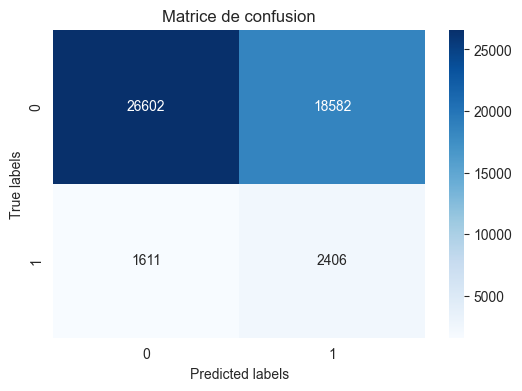

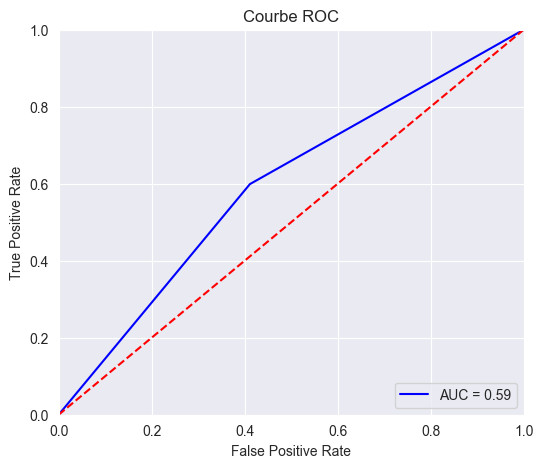

In [49]:
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.71
Threshold optimal : 0.0


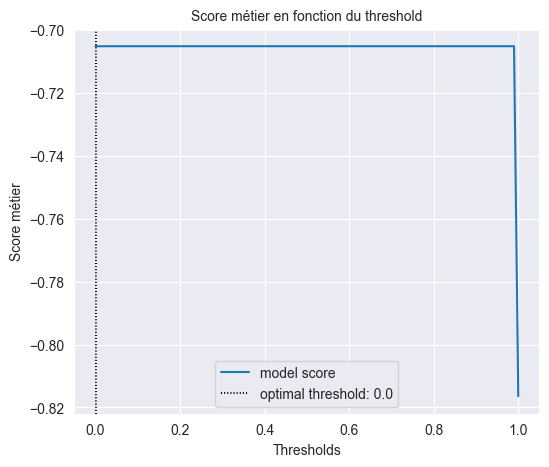

In [50]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Le score métier est dégradé par rapport à la regression logistique à -0.7, mais reste plus élevé que la baseline.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

#### Random Forest Classifier

Score métier :-0.55
Accuracy score : 0.70
Precision score : 0.16
Recall score : 0.66
F1 score : 0.26
Fbeta score : 0.41
ROC AUC score : 0.68


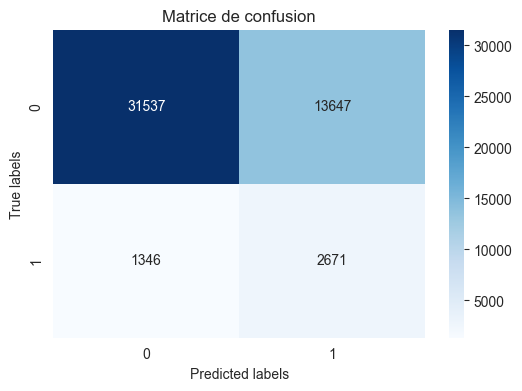

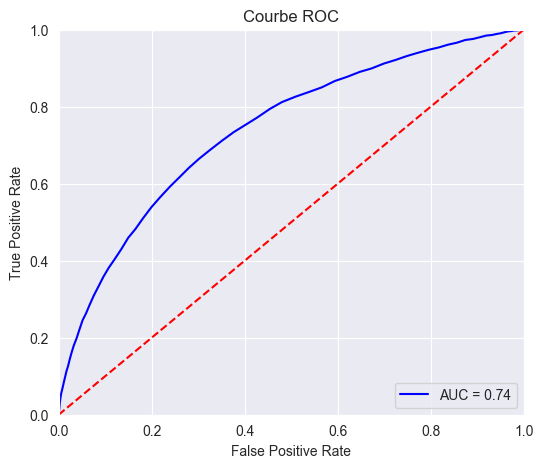

In [51]:
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.55
Threshold optimal : 0.51


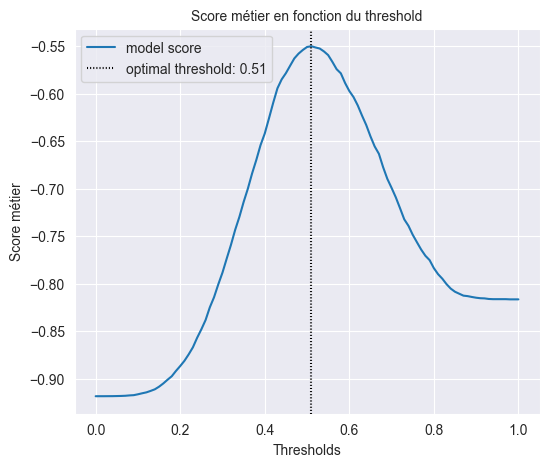

In [52]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Le score métier est légèrement dégradé par rapport à la regression logistique.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

#### XGBoost

Score métier :-0.54
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.68
F1 score : 0.27
Fbeta score : 0.42
ROC AUC score : 0.69


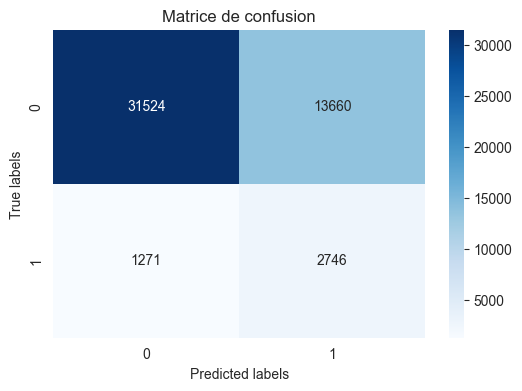

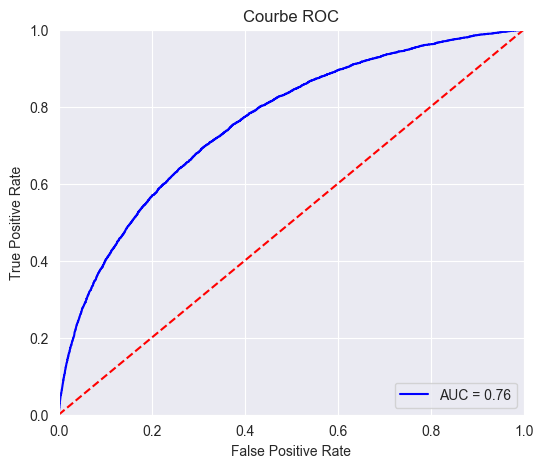

In [53]:
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metrics sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.53
Threshold optimal : 0.56


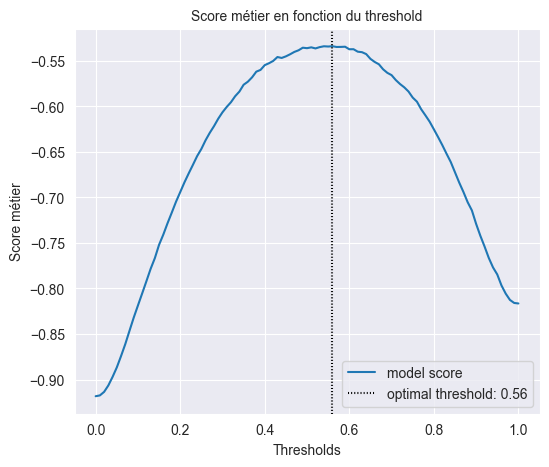

In [54]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Le score métier est légèrement plus élevé par rapport à Random Forest.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

#### LGBM

[LightGBM] [Info] Number of positive: 19804, number of negative: 19804
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.066059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51628
[LightGBM] [Info] Number of data points in the train set: 39608, number of used features: 493
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Score métier :-0.51
Accuracy score : 0.71
Precision score : 0.18
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


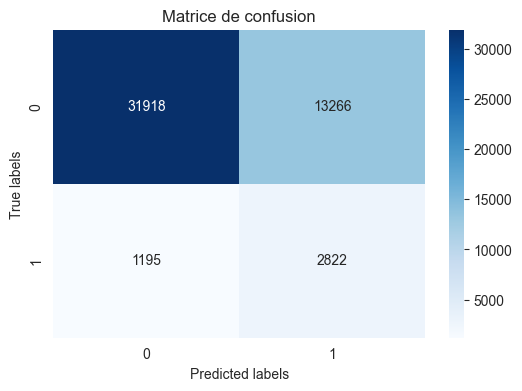

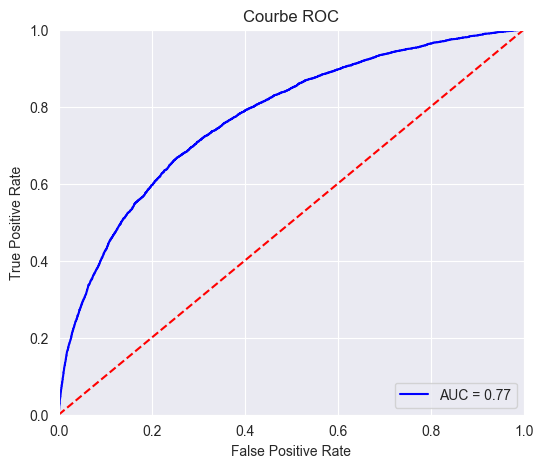

In [55]:
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.51
Threshold optimal : 0.54


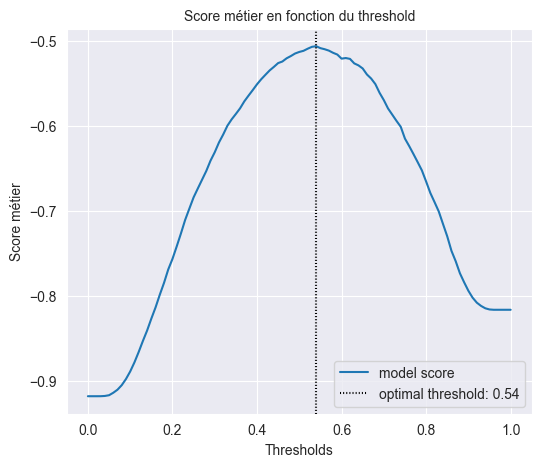

In [56]:
score_metier_max(y_pred_proba, y_val, verbose=True)

Le score métier est légèrement plus élevé par rapport à XGBoots à 0.41.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

# Optimisation des modèles

In [26]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [ ]:
params = {'penalty':['l2'],
          'C':[10, 13, 20],
          'solver':['liblinear']
         }

with mlflow.start_run(run_name='Grid logistic regression'):
    reg_log = LogisticRegression(max_iter=1000, random_state=0)
    grid_reg_log = GridSearchCV(
        reg_log,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_reg_log.fit(X_train_scaled, y_train)

In [ ]:
grid_results = grid_reg_log.cv_results_

In [60]:
print('Meilleurs paramètres',grid_reg_log.best_params_)
#print("Résultats des meilleurs paramètres :\n")
#display(grid_results.loc[result_reg_log['params']==grid_reg_log.best_params_])

Meilleurs paramètres {'C': 20, 'penalty': 'l2', 'solver': 'liblinear'}


In [21]:
def plot_learning_curve(estimator, X, y):
    '''Affiche la courbe d'apprentissage.
    :param: estimator (meilleur estimateur de la grid search), X (valeurs), y (target)
    '''

    train_sizes, train_scores, test_scores = learning_curve(estimator=estimator, X=X, y=y, cv=5,
                                                            train_sizes=np.linspace(0.1, 1.0, 10),
                                                            n_jobs= -1, verbose=0)

    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Score')
    plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
    plt.plot(train_sizes, test_mean, color='green', marker='+', markersize=5, linestyle='--', label='Validation Score')
    plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
    plt.title('Learning Curve')
    plt.xlabel('Training Data Size')
    plt.ylabel('Performance score métier')
    plt.grid()
    plt.legend(loc='lower right')
    plt.show()

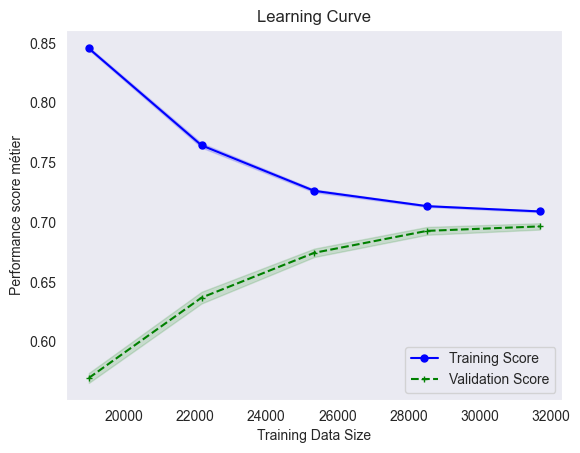

In [62]:
plot_learning_curve(grid_reg_log.best_estimator_, X_train_scaled, y_train)

Score métier :-0.52
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


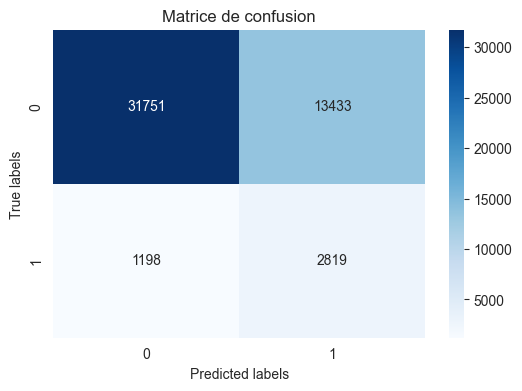

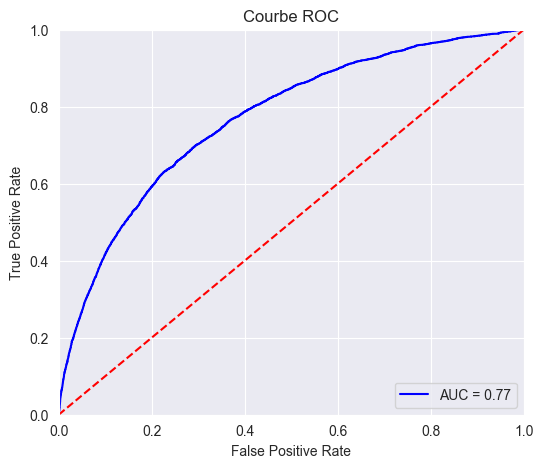

In [63]:
with mlflow.start_run(run_name='Logistic regression optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_reg_log, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

In [64]:
score_metier_max(y_pred_proba, X_val_scaled, y_val)

ValueError: Classification metrics can't handle a mix of continuous-multioutput and binary targets

Après optimisation des hyperparamètres, nous obtenons un score métier de -0.52, ce qui ne change pas par rapport au modèle de base. Les hyperparamètres optimaux ne semblent pas avoir d'impact significatifs sur les performances de notre modèle.

## SVC

In [ ]:
import random
random.seed(0)

In [ ]:
X_train_scaled.shape

In [ ]:
X_train_sample = X_train_scaled.sample(n=10000,axis=0)
y_train_sample = y_train[X_train_sample.index]

In [ ]:
print(X_train_sample.shape)
print(y_train_sample.shape)

In [ ]:
params = {'C':[1e-1, 1, 10],'kernel':['linear', 'rbf']}

with mlflow.start_run(run_name='Grid SVC'):
    svc = SVC(random_state=0, probability=True)
    grid_svc = GridSearchCV(
        svc,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_svc.fit(X_train_sample, y_train_sample)

In [ ]:
result_svc = pd.DataFrame(grid_svc.cv_results_)

In [ ]:
print('Meilleurs paramètres',grid_svc.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_svc.loc[result_svc['params']==grid_svc.best_params_])

In [ ]:
plot_learning_curve(grid_svc.best_estimator_, X_train_sample, y_train_sample)

In [ ]:
with mlflow.start_run(run_name='SVC optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_svc, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

In [ ]:
score_metier_max(y_pred_proba, y_val, verbose=True)

## Decision Tree

In [22]:
params =  {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [2, 5, 10, None]
}


with mlflow.start_run(run_name='Grid Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    grid_tree = GridSearchCV(
        tree,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_tree.fit(X_train_scaled, y_train)

In [23]:
result_tree = pd.DataFrame(grid_tree.cv_results_)

In [24]:
print('Meilleurs paramètres',grid_tree.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_tree.loc[result_tree['params']==grid_tree.best_params_])

Meilleurs paramètres {'criterion': 'entropy', 'max_depth': None}
Résultats des meilleurs paramètres :


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
7,120.235212,10.224554,0.267173,0.052092,entropy,None,"{'criterion': 'entropy', 'max_depth': None}",-0.755696,-0.741123,-0.745412,-0.743826,-0.742973,-0.745806,0.005135,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0


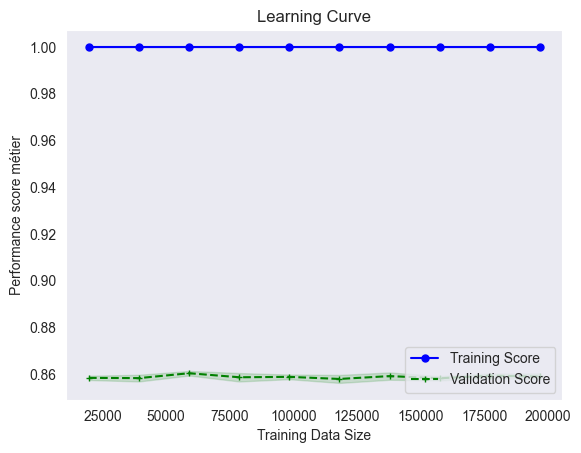

In [27]:
plot_learning_curve(grid_tree.best_estimator_, X_train_scaled, y_train)

Score métier :-0.75
Accuracy score : 0.86
Precision score : 0.16
Recall score : 0.17
F1 score : 0.16
Fbeta score : 0.16
ROC AUC score : 0.54


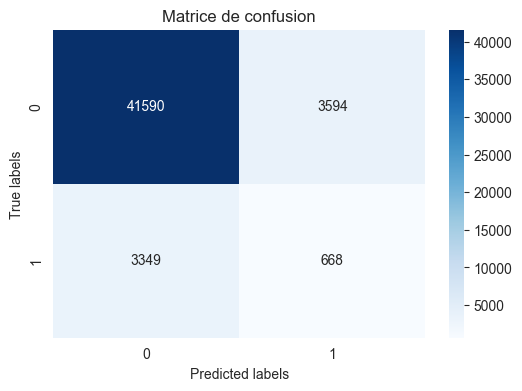

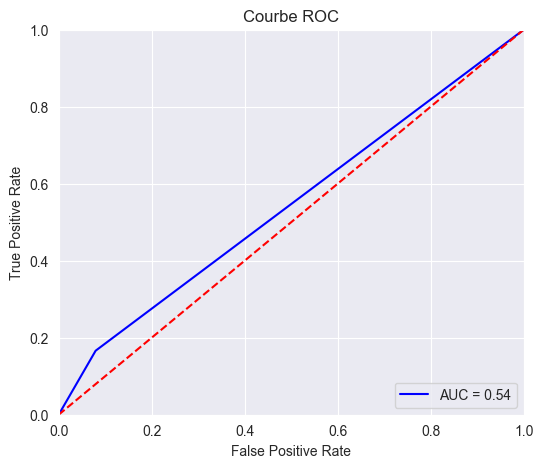

In [28]:
with mlflow.start_run(run_name='Decision Tree optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_tree, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier maximum : -0.75
Threshold optimal : 0.0


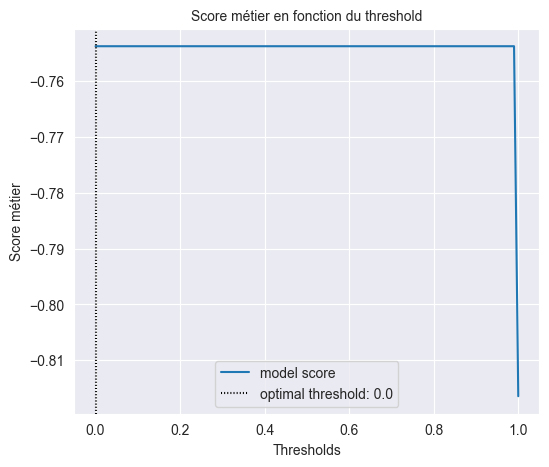

In [29]:
score_metier_max(y_pred_proba, y_val, verbose=True)

## Random Forest

In [21]:
params = {'n_estimators' : [100, 500, 1000, 2000],
          'max_depth': [2, 5, 10, None],
         }

with mlflow.start_run(run_name='Grid random forest'):
    rand_fo = RandomForestClassifier(random_state=0)
    grid_rand_fo = GridSearchCV(
        rand_fo,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_rand_fo.fit(X_train_scaled, y_train)

In [22]:
result_rand_fo = pd.DataFrame(grid_rand_fo.cv_results_)
result_rand_fo.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,59.741024,1.498272,0.555100,0.098484,2,100,"{'max_depth': 2, 'n_estimators': 100}",-0.805065,-0.805065,-0.805065,-0.805065,-0.804862,-0.805024,0.000081,5,-0.805014,-0.805014,-0.805014,-0.805014,-0.805065,-0.805024,0.00002
1,212.706608,10.497924,0.946324,0.089295,2,500,"{'max_depth': 2, 'n_estimators': 500}",-0.805065,-0.805065,-0.805065,-0.805065,-0.804862,-0.805024,0.000081,5,-0.805014,-0.805014,-0.805014,-0.805014,-0.805065,-0.805024,0.00002
2,368.707552,13.032326,1.463786,0.122582,2,1000,"{'max_depth': 2, 'n_estimators': 1000}",-0.805065,-0.805065,-0.805065,-0.805065,-0.804862,-0.805024,0.000081,5,-0.805014,-0.805014,-0.805014,-0.805014,-0.805065,-0.805024,0.00002
3,726.414948,3.913581,2.906804,0.424392,2,2000,"{'max_depth': 2, 'n_estimators': 2000}",-0.805065,-0.805065,-0.805065,-0.805065,-0.804862,-0.805024,0.000081,5,-0.805014,-0.805014,-0.805014,-0.805014,-0.805065,-0.805024,0.00002
4,95.505510,4.287423,0.708723,0.129573,5,100,"{'max_depth': 5, 'n_estimators': 100}",-0.805065,-0.805065,-0.805065,-0.805065,-0.804862,-0.805024,0.000081,5,-0.805014,-0.805014,-0.805014,-0.805014,-0.805065,-0.805024,0.00002


In [23]:
print('Meilleurs paramètres',grid_rand_fo.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_rand_fo.loc[result_rand_fo['params']==grid_rand_fo.best_params_])

Meilleurs paramètres {'max_depth': None, 'n_estimators': 100}
Résultats des meilleurs paramètres :


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
12,450.057064,6.92741,5.566732,0.450607,None,100,"{'max_depth': None, 'n_estimators': 100}",-0.804293,-0.804476,-0.804293,-0.804699,-0.803236,-0.804199,0.000504,1,-0.000508,-0.000356,-0.000254,-0.000356,-0.000406,-0.000376,0.000083


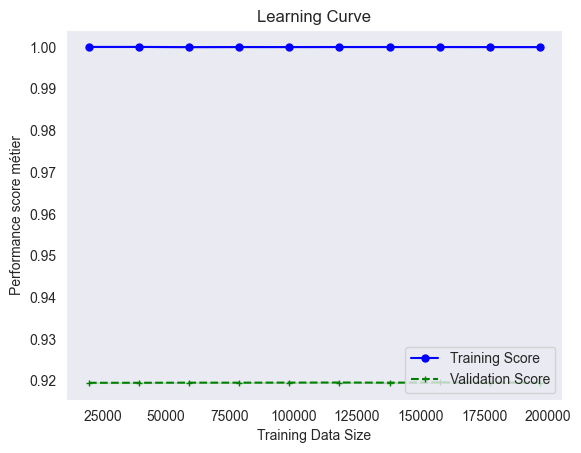

In [24]:
plot_learning_curve(grid_rand_fo.best_estimator_, X_train_scaled, y_train)

Score métier :-0.82
Accuracy score : 0.92
Precision score : 0.86
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


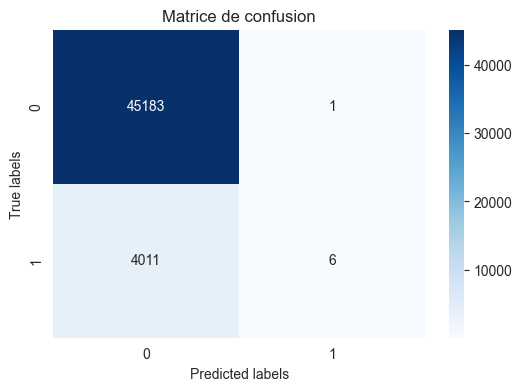

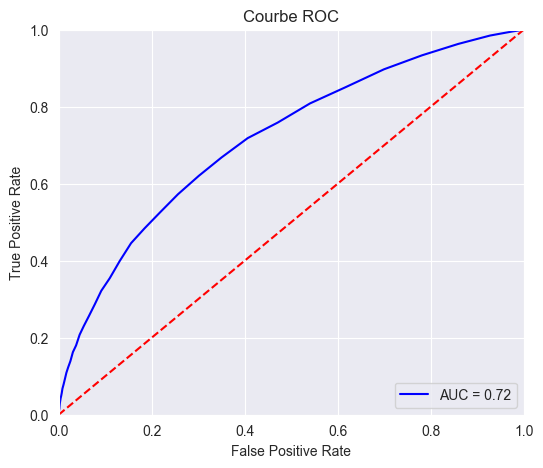

In [25]:
with mlflow.start_run(run_name='Random forest optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_rand_fo, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

## XGBoost Classifier

In [17]:
#params = {'gamma': [0, 0.1, 0.5, 1],
          #'max_depth': [2,4,6],
          #'min_child_weight' : [1,5,10],
          #'n_estimators': [100, 300, 500],
         #}

params={'gamma' : [0],
        'max_depth':[2],
        'min_child_weight':[5],
        'n_estimators':[300]
        }

with mlflow.start_run(run_name='Grid XGBoost'):
    xgb = XGBClassifier(n_jobs=-1,random_state=0)
    grid_xgb = GridSearchCV(
        xgb,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    
    grid_xgb.fit(X_train_scaled, y_train)

In [18]:
result_xgb = pd.DataFrame(grid_xgb.cv_results_)
result_xgb.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gamma,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,97.164174,0.809403,0.691282,0.064399,0,2,5,300,"{'gamma': 0, 'max_depth': 2, 'min_child_weight...",-0.77472,-0.773114,-0.773277,-0.773622,-0.774862,-0.773919,0.000732,1,-0.767921,-0.766387,-0.764817,-0.768978,-0.767977,-0.767216,0.001458


In [19]:
print('Meilleurs paramètres',grid_xgb.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_xgb.loc[result_xgb['params']==grid_xgb.best_params_])

Meilleurs paramètres {'gamma': 0, 'max_depth': 2, 'min_child_weight': 5, 'n_estimators': 300}
Résultats des meilleurs paramètres :


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gamma,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,97.164174,0.809403,0.691282,0.064399,0,2,5,300,"{'gamma': 0, 'max_depth': 2, 'min_child_weight...",-0.77472,-0.773114,-0.773277,-0.773622,-0.774862,-0.773919,0.000732,1,-0.767921,-0.766387,-0.764817,-0.768978,-0.767977,-0.767216,0.001458


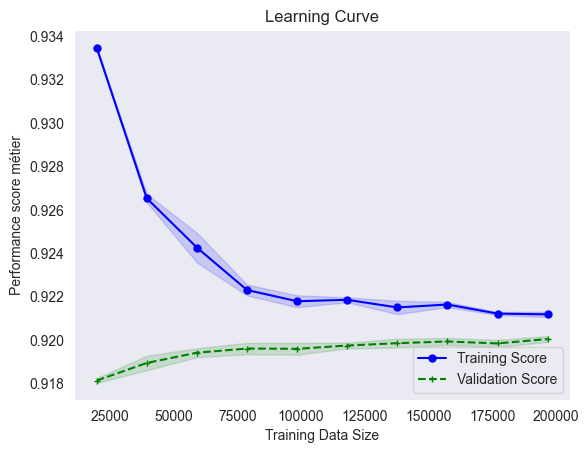

In [22]:
plot_learning_curve(grid_xgb.best_estimator_, X_train_scaled, y_train)

Score métier :-0.78
Accuracy score : 0.92
Precision score : 0.59
Recall score : 0.04
F1 score : 0.08
Fbeta score : 0.05
ROC AUC score : 0.52


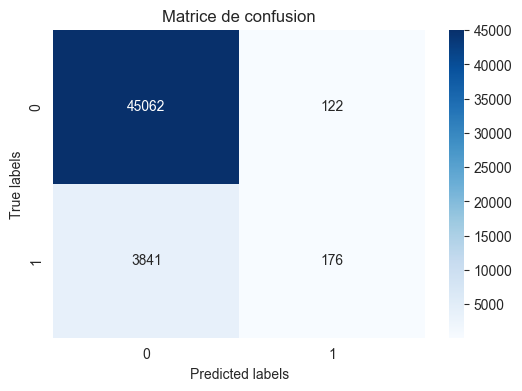

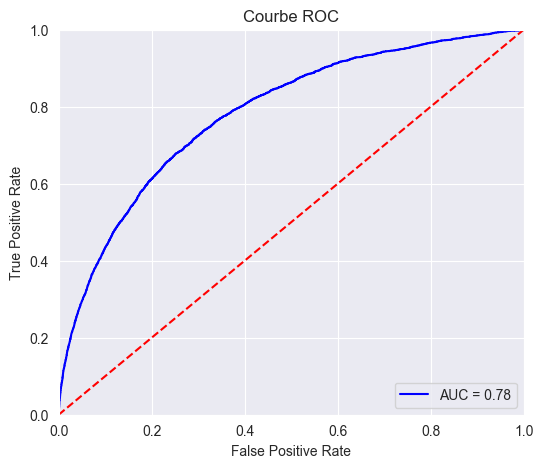

In [23]:
with mlflow.start_run(run_name='XGBoost optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_xgb, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

In [ ]:
score_metier_max(y_pred_proba, X_val_scaled, y_val)

## Light GBM

In [27]:
params = {'n_estimators' : [300],
          'max_depth': [5],
          'num_leaves': [31]
         }

with mlflow.start_run(run_name='Grid Light GBM'):
    lgbm = LGBMClassifier(random_state=0)
    grid_lgbm = GridSearchCV(
        lgbm,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_lgbm.fit(X_train_scaled, y_train)

  File "C:\Users\Shadow\Documents\Scoring\Scoring\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 19804, number of negative: 226201
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.682971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57293
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 518
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080502 -> initscore=-2.435540
[LightGBM] [Info] Start training from score -2.435540
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warni

In [28]:
result_lgbm = pd.DataFrame(grid_lgbm.cv_results_)
result_lgbm.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,95.553804,3.582486,0.857162,0.197603,5,300,31,"{'max_depth': 5, 'n_estimators': 300, 'num_lea...",-0.7747,-0.77098,-0.772586,-0.773765,-0.774151,-0.773236,0.001324,1,-0.7309,-0.732627,-0.72875,-0.733659,-0.732338,-0.731655,0.001699


In [29]:
print('Meilleurs paramètres',grid_lgbm.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_lgbm.loc[result_lgbm['params']==grid_lgbm.best_params_])

Meilleurs paramètres {'max_depth': 5, 'n_estimators': 300, 'num_leaves': 31}
Résultats des meilleurs paramètres :


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,95.553804,3.582486,0.857162,0.197603,5,300,31,"{'max_depth': 5, 'n_estimators': 300, 'num_lea...",-0.7747,-0.77098,-0.772586,-0.773765,-0.774151,-0.773236,0.001324,1,-0.7309,-0.732627,-0.72875,-0.733659,-0.732338,-0.731655,0.001699


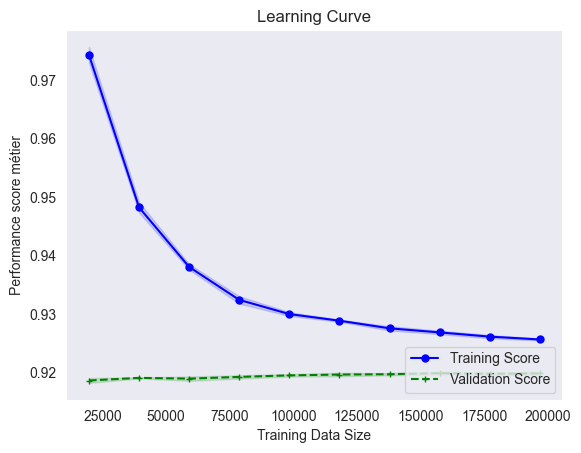

In [30]:
plot_learning_curve(grid_lgbm.best_estimator_, X_train_scaled, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Score métier :-0.78
Accuracy score : 0.92
Precision score : 0.59
Recall score : 0.05
F1 score : 0.10
Fbeta score : 0.06
ROC AUC score : 0.52


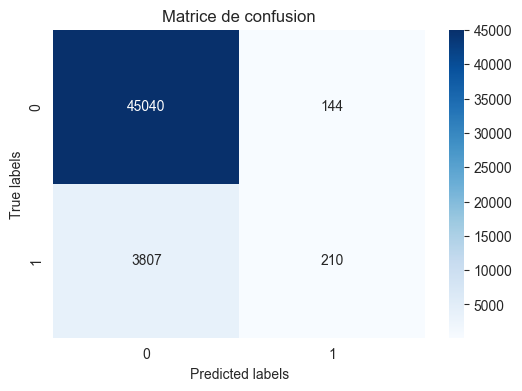

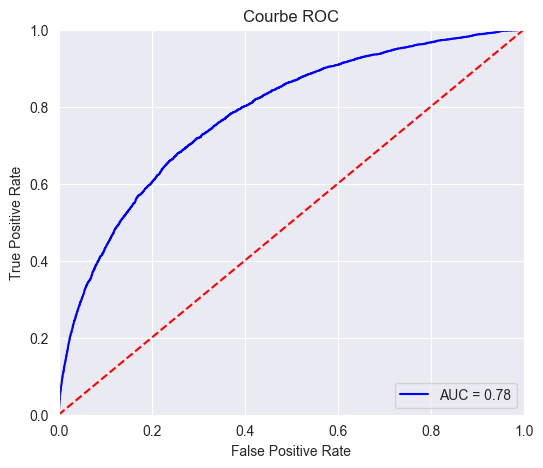

In [31]:
with mlflow.start_run(run_name='Light GBM optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_lgbm, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)



Selection du modèle

Le modèle Light GBM avec les hyperparamètres suivants : 'max_depth': 5, 'n_estimators': 300, 'num_leaves': 31 est le modèle le plus performant. Nous allons donc utiliser ce modèle par la suite. Nous décidons dans un premier temps de réaliser une grid search plus poussée avec l'algorithme Light GBM afin de tenter d'obtenir de meilleures performances.


In [34]:
score_metier = metrics.make_scorer(fonction_metier)

In [35]:
#params = {'n_estimators' : [100, 300, 500, 800],
          #'max_depth': [-1, 2, 5, 7],
          #'num_leaves': [7, 15, 31, 63, 127],
          #'learning_rate': [0.05, 0.1, 0.2, 0.4]
         #}

params = {'n_estimators' : [500],
          'max_depth': [-1],
          'num_leaves': [31],
          'learning_rate': [0.05]
         }

mlflow.lightgbm.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='Grid finale Light GBM'):
    lgbm_fin = LGBMClassifier(random_state=0, njobs=-1)
    grid_lgbm_fin = GridSearchCV(
        lgbm_fin,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)

    grid_lgbm_fin.fit(X_train_scaled, y_train)

[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Info] Number of positive: 19804, number of negative: 226201
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.686517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57293
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 518
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080502 -> initscore=-2.435540
[LightGBM] [Info] Start training from score -2.435540
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs
[LightGBM] [Warning] Unknown parameter: njobs


In [36]:
result_lgbm_fin = pd.DataFrame(grid_lgbm_fin.cv_results_)
result_lgbm_fin.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,134.949758,5.176517,0.941911,0.424182,0.05,-1,500,31,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-0.776753,-0.774029,-0.774639,-0.77224,-0.775147,-0.774561,0.001471,1,-0.73402,-0.73688,-0.735031,-0.73812,-0.735265,-0.735863,0.001455


In [37]:
result_lgbm_fin = pd.DataFrame(grid_lgbm_fin.cv_results_)
result_lgbm_fin.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,134.949758,5.176517,0.941911,0.424182,0.05,-1,500,31,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-0.776753,-0.774029,-0.774639,-0.77224,-0.775147,-0.774561,0.001471,1,-0.73402,-0.73688,-0.735031,-0.73812,-0.735265,-0.735863,0.001455


In [38]:
print('Meilleurs paramètres',grid_lgbm_fin.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_lgbm_fin.loc[result_lgbm_fin['params']==grid_lgbm_fin.best_params_])

Meilleurs paramètres {'learning_rate': 0.05, 'max_depth': -1, 'n_estimators': 500, 'num_leaves': 31}
Résultats des meilleurs paramètres :


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,134.949758,5.176517,0.941911,0.424182,0.05,-1,500,31,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-0.776753,-0.774029,-0.774639,-0.77224,-0.775147,-0.774561,0.001471,1,-0.73402,-0.73688,-0.735031,-0.73812,-0.735265,-0.735863,0.001455


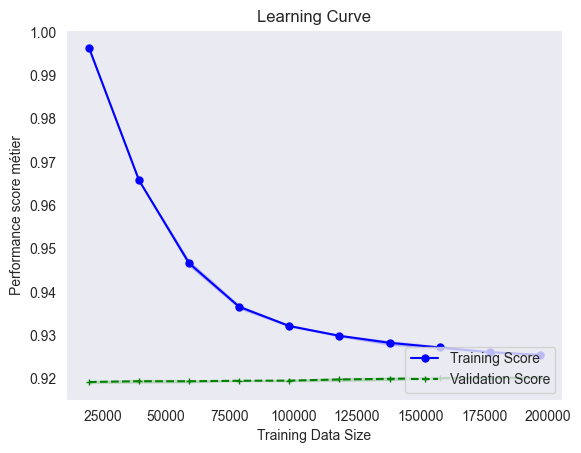

In [39]:
plot_learning_curve(grid_lgbm_fin.best_estimator_, X_train_scaled, y_train)

[LightGBM] [Warning] Unknown parameter: njobs
Score métier :-0.78
Accuracy score : 0.92
Precision score : 0.60
Recall score : 0.04
F1 score : 0.08
Fbeta score : 0.05
ROC AUC score : 0.52


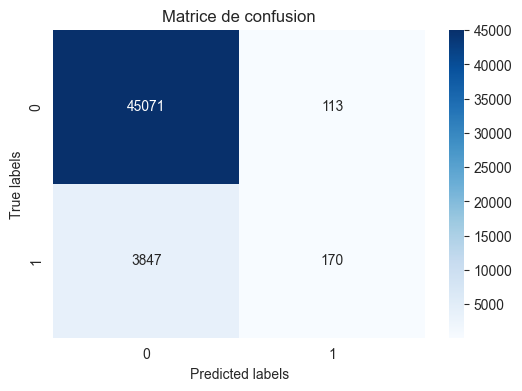

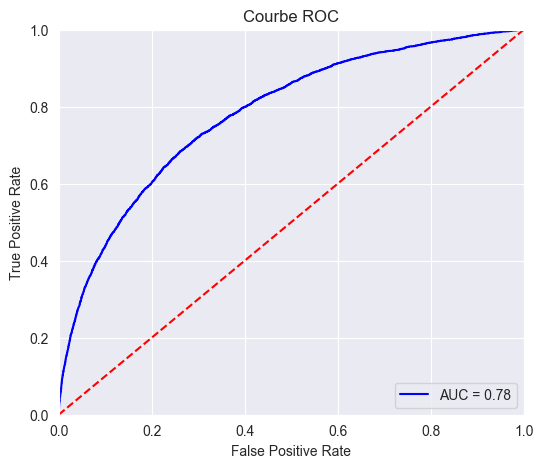

In [40]:
mlflow.lightgbm.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='Light GBM final optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_lgbm_fin, X_val_scaled, y_val)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

In [41]:
score_metier_max(y_pred_proba, X_val_scaled, y_val)

ValueError: Classification metrics can't handle a mix of continuous-multioutput and binary targets

[LightGBM] [Info] Number of positive: 19804, number of negative: 226201
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.672067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57293
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 518
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080502 -> initscore=-2.435540
[LightGBM] [Info] Start training from score -2.435540
Score métier :-0.79
Accuracy score : 0.92
Precision score : 0.63
Recall score : 0.03
F1 score : 0.06
Fbeta score : 0.04
ROC AUC score : 0.51


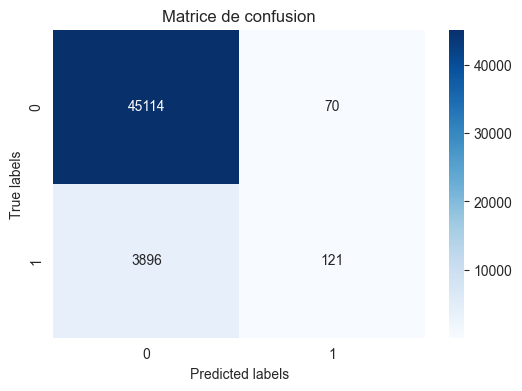

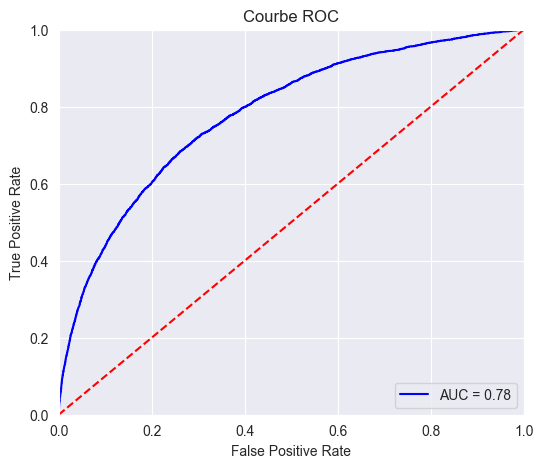

In [42]:
mlflow.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='model select'):
    lgbm_final = LGBMClassifier(learning_rate=0.05, max_depth=-1, n_estimators=500, num_leaves=31, random_state=0)
    lgbm_final.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm_final, X_val_scaled, y_val, seuil=0.54)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Notre modèle final est donc un Light GBM avec les paramètres learning_rate=0.05, max_depth=-1, n_estimators=500, num_leaves=31 et un seuil à 0.54. Nous intégrons également une pipeline d'entraînement du modèle avec standardisation des données et undersampling.

[LightGBM] [Info] Number of positive: 19804, number of negative: 19804
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51628
[LightGBM] [Info] Number of data points in the train set: 39608, number of used features: 493
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Score métier :-0.51
Accuracy score : 0.75
Precision score : 0.19
Recall score : 0.65
F1 score : 0.29
Fbeta score : 0.44
ROC AUC score : 0.70


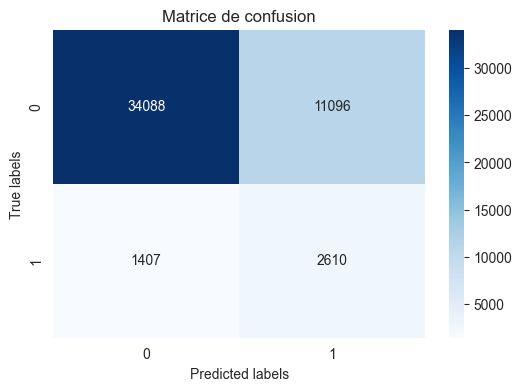

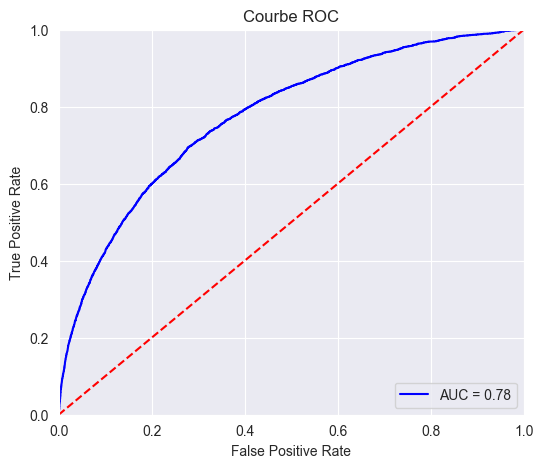

In [43]:
cols = X_train.select_dtypes(['float64']).columns
preprocessor = ColumnTransformer([('quanti',StandardScaler(),cols)],remainder='passthrough')

pipe = Pipeline(steps = [['scaler', preprocessor],
                         ['sampling',RandomUnderSampler()],
                         ['classifier', LGBMClassifier(learning_rate=0.05,
                                                       max_depth=-1,
                                                       n_estimators=500,
                                                       num_leaves=31,
                                                       random_state=0)]
                        ])



mlflow.lightgbm.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='pip final'):
    pipe.fit(X_train, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(pipe, X_val, y_val, seuil=0.54)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

Score métier :-0.51
Accuracy score : 0.74
Precision score : 0.19
Recall score : 0.65
F1 score : 0.29
Fbeta score : 0.44
ROC AUC score : 0.70


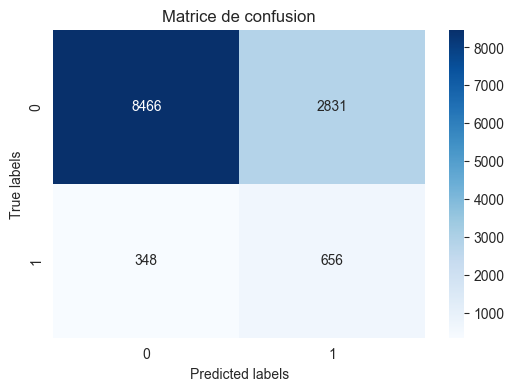

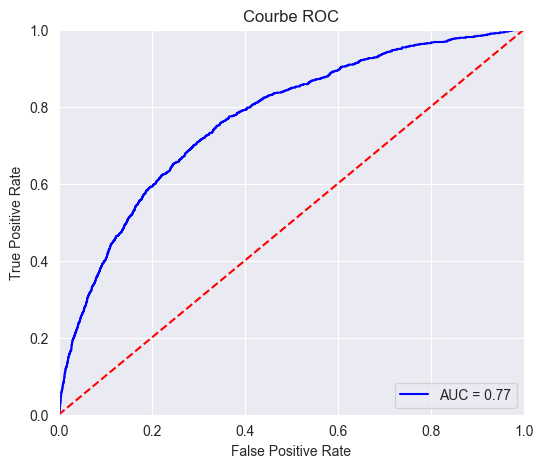

In [44]:
mlflow.lightgbm.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='pip jeu test'):

    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(pipe, X_val_test, y_val_test, seuil=0.54)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)

In [45]:
from mlflow.models.signature import infer_signature

In [46]:
signature = infer_signature(X_train, y_train)
mlflow.sklearn.save_model(pipe, 'mlflow_model', signature=signature)

In [47]:
from joblib import dump
dump(pipe, "model.pkl")

['model.pkl']

In [48]:
pipe = pd.read_pickle('mlflow_model/model.pkl')

In [49]:
explainer_pipe = shap.TreeExplainer(pipe['classifier'])
shap_values_pipe = explainer_pipe.shap_values(X_val_scaled)

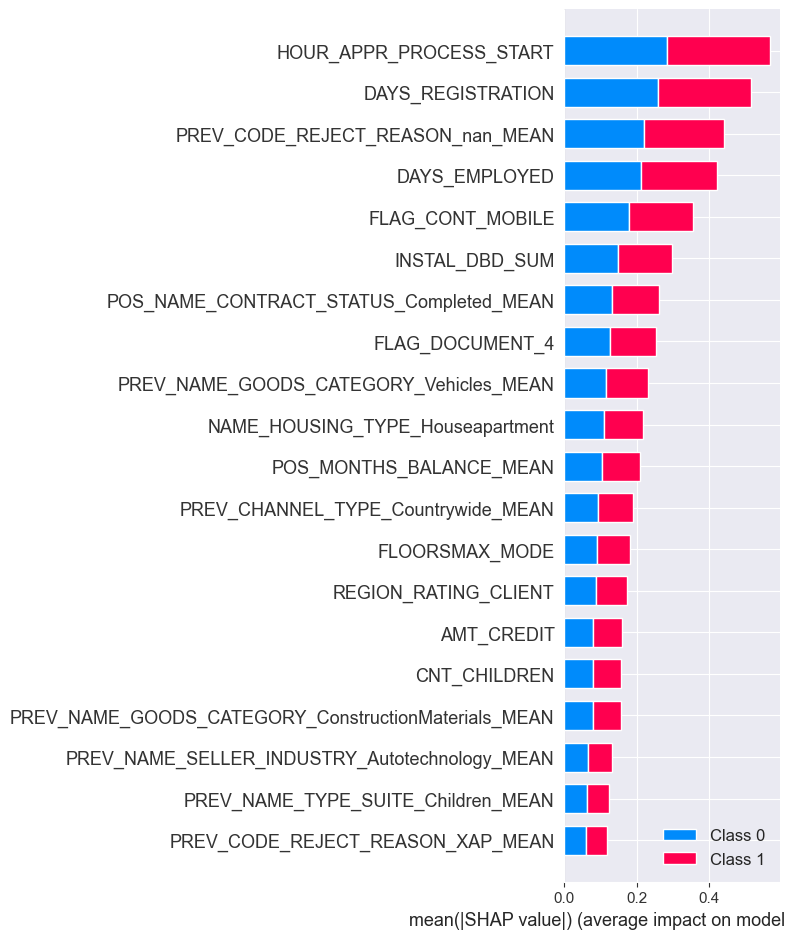

In [50]:
shap.summary_plot(shap_values_pipe, X_val_scaled, plot_type='bar')

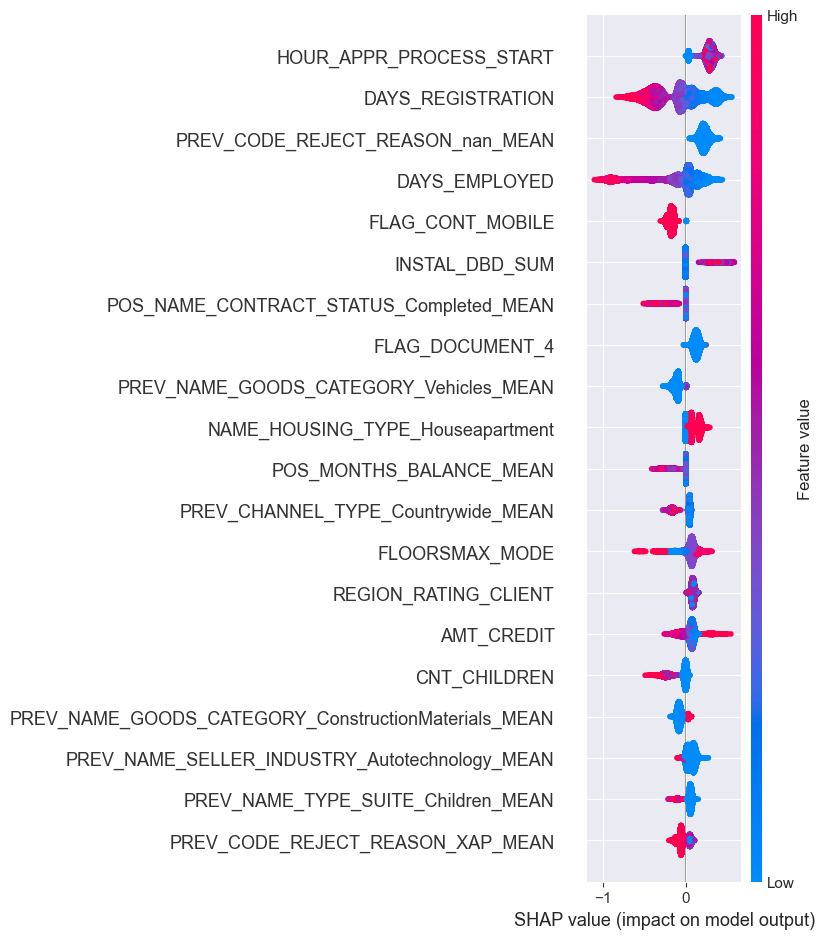

In [51]:
shap.summary_plot(shap_values_pipe[1], X_val_scaled.values, feature_names = X_val_scaled.columns)

Le graphique utilise les valeurs SHAP pour montrer la distribution des impacts de chaque feature sur la sortie du modèle.

Les deux features les plus importantes sont PREV_NAME_CLIENT_TYPE_XNA_MEAN et DAYS_REGISTRATION. Pour les deux, leurs valeurs faibles poussent la prédiction vers 1 (soit le client fait défaut). On peut constater que cette tendance s'inverse pour d'autres features telles que NAME_TYPE_SUITE_Unaccompanied par exemple.

In [52]:
i = 0
shap.initjs()
print("Individu ID: {}".format(X_val_scaled.index[i]))
shap.force_plot(explainer_pipe.expected_value[1],
                shap_values_pipe[1][i],
                X_val_scaled.values[i],
                feature_names = X_val_scaled.columns)

Individu ID: 295300


In [53]:
i = 1
shap.initjs()
print("Individu ID: {}".format(X_val_scaled.index[i]))
shap.force_plot(explainer_pipe.expected_value[1],
                shap_values_pipe[1][i],
                X_val_scaled.values[i],
                feature_names = X_val_scaled.columns)

Individu ID: 105571


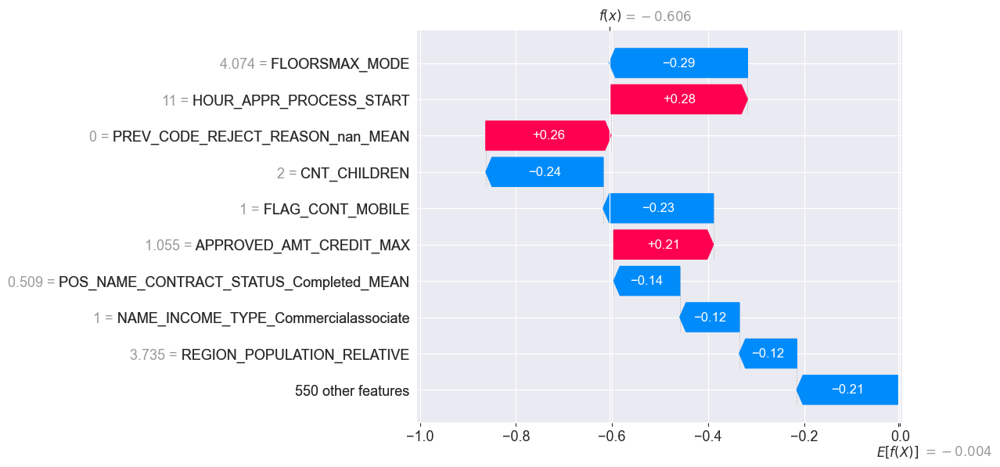

In [54]:
# Individu ID: 284800
shap.waterfall_plot(explainer_pipe(X_val_scaled)[0][:,1])

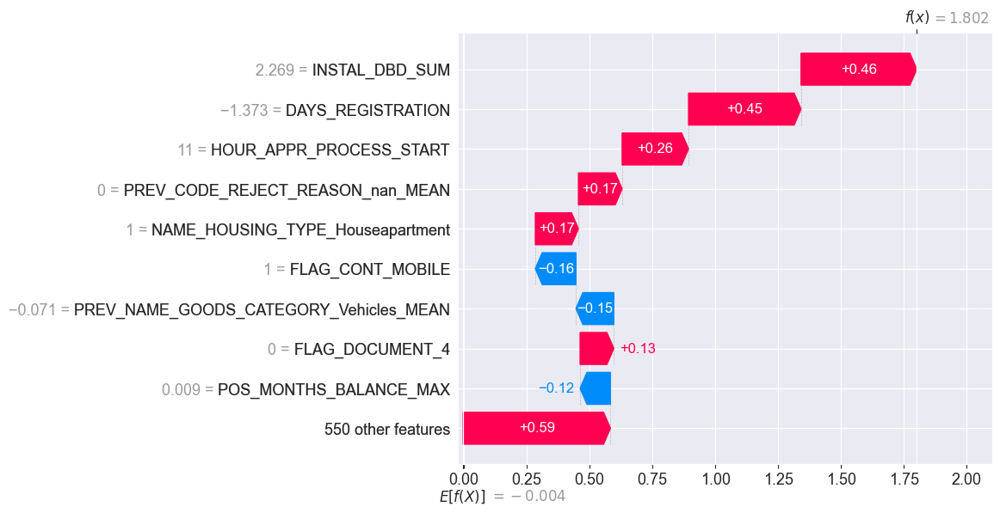

In [55]:
# Individu ID: 321072
shap.waterfall_plot(explainer_pipe(X_val_scaled)[1][:,1])

In [ ]:
# Individu ID: 124755
shap.waterfall_plot(explainer_pipe(X_val_scaled)[2][:,1])

# Data Drift

Le Data Drift est une variation des données du monde réel par rapport aux données utilisées pour tester et valider le modèle avant de le déployer en production. L’une des causes principales est la dimension temporelle.

Le data drift peut affecter les performances du modèle Machine Learning. Il existe différents types de drift. Il peut y avoir des changements dans la distribution cible, ou encore un covariate drift qui est un changement dans la distribution des données d'entrée (par exemple une variable aura une autre catégorie).

L'approche pour détecter le data drift consiste à utiliser des tests statistiques qui comparent la distribution des données de référence (reference data) et des données actuelles ou current data (données de production). Si la différence entre deux distributions est significative alors un drift s'est produit. Pour un dataset volumineux (avec > 1 000 observations dans l'ensemble de données de référence), la Distance de Wasserstein est utilisée pour les colonnes numériques (n_unique > 5), et pour les colonnes catégorielles ou numériques (avec n_unique <= 5) c'est la Divergence de Jensen--Shannon qui est appliquée.

In [56]:
from evidently.report import Report
from evidently.metrics import DataDriftTable, DatasetDriftMetric

In [57]:
train_df = pd.read_csv('input/application_train.csv')
test_df = pd.read_csv('input/application_test.csv')

In [58]:
ref = train_df.drop(['TARGET'],axis=1).iloc[:48744,:]
cur = test_df

In [59]:
data_drift_dataset_report = Report(metrics=[DatasetDriftMetric(), DataDriftTable()])

data_drift_dataset_report.run(reference_data=ref, current_data=cur)

In [60]:
data_drift_dataset_report.show(mode='inline')

On constate donc qu'il n'y a pas de data drift entre nos données de référence (données d'entrainement) et nos données actuelles (données de test), bien qu'un léger drift ait été détecté dans 10 de nos colonnes.